# Detección de Defectos en Imágenes con Autoencoder Convolucional (CAE)

**Autora:** Julia García Vega

**Fecha:** 14/07/2025

**Descripción:**
<br>
En este notebook se implementan variantes de autoencoder convolucional para la detección no supervisada de anomalías en imágenes industriales. El modelo se entrena exclusivamente con imágenes normales, con el objetivo de aprender una representación compacta que permita su reconstrucción fiel. Al evaluar imágenes que contienen defectos, la reconstrucción presenta fallos principalmente en las zonas anómalas, generando un mapa de error que posibilita la detección y localización de dichas anomalías.

Se exploran distintas arquitecturas y configuraciones de hiperparámetros para optimizar el desempeño del modelo, incluyendo el uso de conexiones tipo skip (similar a U-Net), variación en el tamaño del espacio latente, técnicas de regularización como dropout y L2, además de diferentes funciones de pérdida, como la sustitución de la pérdida MSE por pérdidas perceptuales (SSIM). También se considera la aplicación de técnicas de aumento de datos durante el entrenamiento para mejorar la robustez del modelo.

Este enfoque permite realizar tanto una clasificación binaria (imagen normal vs. anómala) basada en el error global, como una segmentación débil a nivel píxel mediante el análisis del error de reconstrucción. Para la evaluación se utiliza el dataset MVTec AD.


## Configuración inicial

In [27]:
from google.colab import files
import os
from sklearn.model_selection import train_test_split
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.image import resize
from tensorflow.keras import layers
from PIL import Image
from tensorflow.keras import layers, models, losses
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import regularizers
from tensorflow.keras.applications import ResNet50
from sklearn.metrics import roc_auc_score, average_precision_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
import numpy as np
import matplotlib.pyplot as plt

In [2]:
DATA_DIR = "/content/mvtec_dataset/cable"
IMG_SIZE = (256, 256)

## Importación de los datos

Se procede a descargar el conjunto de datos MVTec Anomaly Detection desde Kaggle, un dataset ampliamente utilizado para la detección de anomalías en imágenes industriales. Este conjunto incluye imágenes de diferentes objetos y texturas, con categorías que presentan ejemplos tanto de condiciones normales como de defectos.

Para este proyecto, se selecciona una categoría específica del dataset, en concreto cable, la cual contiene imágenes normales para entrenamiento y validación, junto con imágenes defectuosas agrupadas en distintas subcategorías. Además, se dispone de máscaras binarias en la carpeta de ground_truth que indican la ubicación exacta de los defectos para evaluación de segmentación.

Esta organización facilita la preparación y carga de datos para el entrenamiento no supervisado y la evaluación tanto de la detección como de la localización de anomalías.


In [3]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"juliagarve","key":"5649c5612324fd329c47d1502707613b"}'}

In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d ipythonx/mvtec-ad

Dataset URL: https://www.kaggle.com/datasets/ipythonx/mvtec-ad
License(s): copyright-authors
100% 4.91G/4.91G [00:56<00:00, 22.5MB/s]
100% 4.91G/4.91G [00:56<00:00, 93.7MB/s]


In [6]:
!mkdir -p mvtec_dataset
!unzip -q mvtec-ad.zip -d mvtec_dataset/

In [7]:
def load_train_image_paths(train_dir):
    normal_dir = os.path.join(train_dir, "good")
    image_paths = sorted([os.path.join(normal_dir, f) for f in os.listdir(normal_dir)])
    return image_paths

def load_test_image_and_mask_paths(test_dir, gt_dir):
    image_paths = []
    mask_paths = []
    labels = []

    # Normales (sin máscara)
    normal_dir = os.path.join(test_dir, "good")
    normal_images = sorted([os.path.join(normal_dir, f) for f in os.listdir(normal_dir)])
    image_paths.extend(normal_images)
    mask_paths.extend([None] * len(normal_images))
    labels.extend([0] * len(normal_images))

    # Defectuosas con máscaras
    for defect in os.listdir(test_dir):
        if defect == "good":
            continue
        defect_dir = os.path.join(test_dir, defect)
        mask_dir = os.path.join(gt_dir, defect)
        defect_images = sorted([os.path.join(defect_dir, f) for f in os.listdir(defect_dir)])

        for img_path in defect_images:
            fname = os.path.basename(img_path)
            mask_path = os.path.join(mask_dir, fname).rsplit(".", 1)[0] + "_mask.png"
            image_paths.append(img_path)
            mask_paths.append(mask_path)
            labels.append(1)

    return image_paths, mask_paths, labels

In [8]:
train_dir = os.path.join(DATA_DIR, "train")
test_dir = os.path.join(DATA_DIR, "test")
gt_dir = os.path.join(DATA_DIR, "ground_truth")

train_image_paths = load_train_image_paths(train_dir)
test_image_paths, test_mask_paths, test_labels = load_test_image_and_mask_paths(test_dir, gt_dir)

In [9]:
print(f"Train images: {len(train_image_paths)}")
print(f"Test images: {len(test_image_paths)}")
print(f"Test masks: {len(test_mask_paths)}")
print(f"Test labels: {len(test_labels)}")

Train images: 224
Test images: 150
Test masks: 150
Test labels: 150


In [10]:
print("Ejemplos de imágenes de entrenamiento:")
for path in train_image_paths[:3]:
    print(" -", path)

print("\nEjemplos de imágenes de test:")
for i in range(3):
    print(f" - {test_image_paths[i]} | Mask: {test_mask_paths[i]} | Label: {test_labels[i]}")
for i in range(-3, 0):
    print(f" - {test_image_paths[i]} | Mask: {test_mask_paths[i]} | Label: {test_labels[i]}")

Ejemplos de imágenes de entrenamiento:
 - /content/mvtec_dataset/cable/train/good/000.png
 - /content/mvtec_dataset/cable/train/good/001.png
 - /content/mvtec_dataset/cable/train/good/002.png

Ejemplos de imágenes de test:
 - /content/mvtec_dataset/cable/test/good/000.png | Mask: None | Label: 0
 - /content/mvtec_dataset/cable/test/good/001.png | Mask: None | Label: 0
 - /content/mvtec_dataset/cable/test/good/002.png | Mask: None | Label: 0
 - /content/mvtec_dataset/cable/test/combined/008.png | Mask: /content/mvtec_dataset/cable/ground_truth/combined/008_mask.png | Label: 1
 - /content/mvtec_dataset/cable/test/combined/009.png | Mask: /content/mvtec_dataset/cable/ground_truth/combined/009_mask.png | Label: 1
 - /content/mvtec_dataset/cable/test/combined/010.png | Mask: /content/mvtec_dataset/cable/ground_truth/combined/010_mask.png | Label: 1


## Visualización de imágenes, etiquetas y su máscara correspondiente

In [11]:
def show_one_per_class(image_paths, mask_paths, labels):
    """
    Muestra una imagen sin defecto y una por cada tipo de defecto.
    """
    seen_defects = {}
    good_shown = False
    selected = []

    for img_path, mask_path, label in zip(image_paths, mask_paths, labels):
        # Si es imagen sin defecto
        if label == 0 and not good_shown:
            selected.append((img_path, mask_path, "Good"))
            good_shown = True
        elif label == 1:
            # Obtener nombre del defecto desde la ruta (ej: "missing_cable")
            defect_type = os.path.basename(os.path.dirname(img_path))
            if defect_type not in seen_defects:
                selected.append((img_path, mask_path, defect_type))
                seen_defects[defect_type] = True

        # Parar si ya tenemos suficiente
        if good_shown and len(seen_defects) >= 8:
            break

    # Mostrar
    plt.figure(figsize=(15, 3 * len(selected)))
    for i, (img_path, mask_path, label) in enumerate(selected):
        img = load_img(img_path, target_size=(256, 256))
        img_arr = img_to_array(img) / 255.0

        plt.subplot(len(selected), 3, i * 3 + 1)
        plt.imshow(img_arr)
        plt.title(f"Image ({label})")
        plt.axis('off')

        if mask_path is not None and os.path.exists(mask_path):
            mask = load_img(mask_path, color_mode='grayscale', target_size=(256, 256))
            mask_arr = img_to_array(mask) / 255.0
            plt.subplot(len(selected), 3, i * 3 + 2)
            plt.imshow(mask_arr.squeeze(), cmap='gray')
            plt.title("Mask")
            plt.axis('off')
        else:
            plt.subplot(len(selected), 3, i * 3 + 2)
            plt.text(0.5, 0.5, "No Mask", ha='center', va='center')
            plt.axis('off')

        plt.subplot(len(selected), 3, i * 3 + 3)
        plt.text(0.5, 0.5, f"Label: {label}", ha='center', va='center', fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

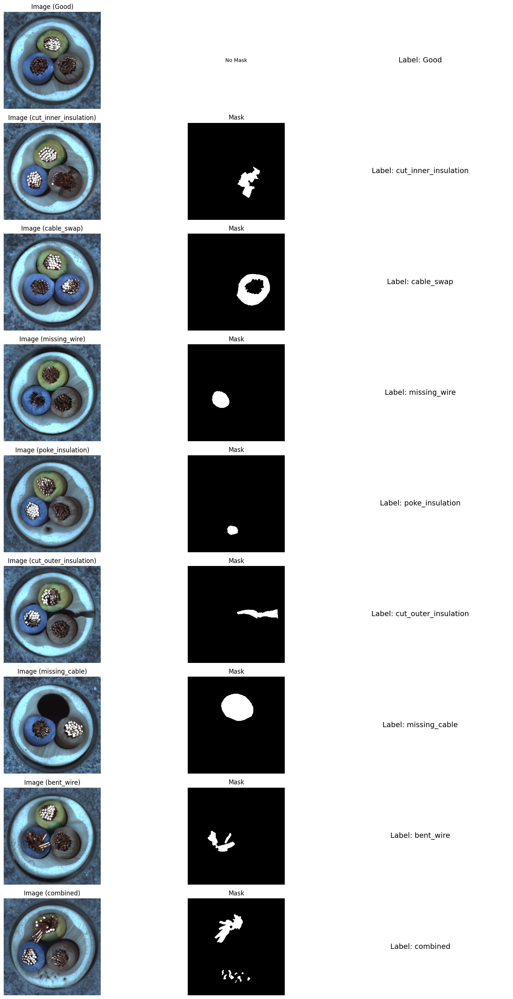

In [12]:
show_one_per_class(test_image_paths, test_mask_paths, test_labels)

## Preprocesamiento del conjunto de datos


In [13]:
train_paths, val_paths = train_test_split(train_image_paths, test_size=0.2, random_state=42)

In [14]:
def create_black_masks(image_paths, target_size=(256, 256), output_dir=None):
    os.makedirs(output_dir, exist_ok=True)
    for path in image_paths:
        fname = os.path.basename(path)
        mask_name = fname.rsplit('.', 1)[0] + "_mask.png"
        mask_path = os.path.join(output_dir, mask_name)

        if not os.path.exists(mask_path):
            black = np.zeros(target_size, dtype=np.uint8)
            Image.fromarray(black).save(mask_path)

In [15]:
create_black_masks(
    [p for i, p in enumerate(test_image_paths) if test_labels[i] == 0],
    target_size=(256, 256),
    output_dir=os.path.join(gt_dir, "good")
)

In [16]:
for i in range(len(test_image_paths)):
    if test_labels[i] == 0:
        fname = os.path.basename(test_image_paths[i])
        mask_name = fname.rsplit('.', 1)[0] + "_mask.png"
        test_mask_paths[i] = os.path.join(gt_dir, "good", mask_name)

In [17]:
def preprocess_image(path, target_size=(256, 256)):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, target_size)
    img = tf.cast(img, tf.float32) / 255.0
    return img

def preprocess_mask(path, target_size=(256, 256)):
    mask = tf.io.read_file(path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, target_size)
    mask = tf.cast(mask, tf.float32) / 255.0
    return tf.squeeze(mask)

def augment_image(img):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_brightness(img, 0.1)
    img = tf.image.random_contrast(img, 0.8, 1.2)
    img = tf.clip_by_value(img, 0.0, 1.0)
    return img

def load_dataset(image_paths, augment=False, batch_size=32, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices(image_paths)
    ds = ds.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    if augment:
        ds = ds.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(buffer_size=1000)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    ds = ds.map(lambda x: (x, x), num_parallel_calls=tf.data.AUTOTUNE)
    return ds

def load_preprocessed_images_and_masks(image_paths, mask_paths, target_size=(256, 256)):
    originals = []
    masks = []

    for img_path, mask_path in zip(image_paths, mask_paths):
        img_tensor = preprocess_image(img_path, target_size)
        mask_tensor = preprocess_mask(mask_path, target_size)

        originals.append(img_tensor.numpy())
        masks.append(mask_tensor.numpy())

    return np.array(originals), np.array(masks)

In [18]:
train_ds = load_dataset(train_paths, augment=True)
val_ds = load_dataset(val_paths, augment=False)
test_images, test_masks = load_preprocessed_images_and_masks(test_image_paths, test_mask_paths)

In [19]:
print(test_images.shape)
print(test_masks.shape)
print(len(test_labels))

(150, 256, 256, 3)
(150, 256, 256)
150


Batch shape: (32, 256, 256, 3)


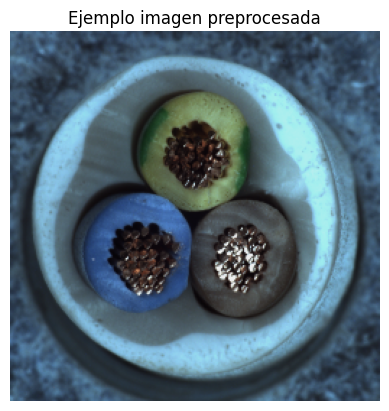

In [20]:
for batch in train_ds.take(1):
    images, targets = batch
    print("Batch shape:", images.shape)

    plt.imshow(images[0].numpy())
    plt.title("Ejemplo imagen preprocesada")
    plt.axis('off')
    plt.show()

## Construcción de distintas arquitecturas de CAE

### Estructura base del Autoencoder

In [21]:
def build_basic_ae(input_shape=(256,256,3), embedding_dim=128):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    x = layers.MaxPooling2D(2, padding='same')(x)

    # Bottleneck
    shape_before_flatten = tf.keras.backend.int_shape(x)[1:]
    flat_dim = int(np.prod(shape_before_flatten))
    x = layers.Flatten()(x)
    embedding = layers.Dense(embedding_dim, name='embedding')(x)

    # Decoder
    x = layers.Dense(flat_dim)(embedding)
    x = layers.Reshape(shape_before_flatten)(x)
    x = layers.Conv2DTranspose(128, 3, strides=2, activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(32, 3, strides=2, activation='relu', padding='same')(x)
    outputs = layers.Conv2D(3, 3, activation='sigmoid', padding='same')(x)

    model = models.Model(inputs, outputs, name="basic_autoencoder")

    return model

In [22]:
basic_ae = build_basic_ae()
basic_ae.summary()

Model: "basic_autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Dense)               │ (None, 128)            │    16,777,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 131072)         │    16,908,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 64, 64, 128)    │       147,584 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 128, 128, 64)   │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 256, 256, 32)   │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 256, 256, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,019,587 (129.77 MB)

 Trainable params: 34,019,587 (129.77 MB)

 Non-trainable params: 0 (0.00 B)

### Autoencoder profundo con técnicas de regularización, Opción 1

In [23]:
def build_deep_ae_with_reg_option_1(input_shape=(256,256,3), embedding_dim=128, l2_reg=1e-4):
    reg = regularizers.l2(l2_reg)
    inputs = layers.Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(32, 3, padding='same', activation='relu', kernel_regularizer=reg)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Dropout(0.1)(x)

    x = layers.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=reg)(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Dropout(0.15)(x)

    x = layers.Conv2D(128, 3, padding='same', activation='relu', kernel_regularizer=reg)(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Dropout(0.2)(x)

    x = layers.Conv2D(256, 3, padding='same', activation='relu', kernel_regularizer=reg)(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Dropout(0.25)(x)

    # Bottleneck
    shape_before_flatten = tf.keras.backend.int_shape(x)[1:]
    flat_dim = int(np.prod(shape_before_flatten))
    x = layers.Flatten()(x)
    embedding = layers.Dense(embedding_dim, kernel_regularizer=reg, name='embedding')(x)

    # Decoder
    x = layers.Dense(flat_dim, kernel_regularizer=reg)(embedding)
    x = layers.Reshape(shape_before_flatten)(x)

    x = layers.Conv2DTranspose(256, 3, strides=2, padding='same', activation='relu', kernel_regularizer=reg)(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', activation='relu', kernel_regularizer=reg)(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu', kernel_regularizer=reg)(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu', kernel_regularizer=reg)(x)
    x = layers.BatchNormalization()(x)

    outputs = layers.Conv2D(3, 3, activation='sigmoid', padding='same')(x)

    model = models.Model(inputs, outputs, name="deep_autoencoder_with_reg_option_1")

    return model

In [24]:
deep_ae_option_1 = build_deep_ae_with_reg_option_1()
deep_ae_option_1.summary()

Model: "deep_autoencoder_with_reg_option_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Dense)               │ (None, 128)            │     8,388,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 65536)          │     8,454,144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 32, 32, 256)    │       590,080 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 18,213,379 (69.48 MB)

 Trainable params: 18,211,459 (69.47 MB)

 Non-trainable params: 1,920 (7.50 KB)

### Autoencoder profundo con técnicas de regularización, Opción 2

In [25]:
def build_deep_ae_with_reg_option_2(input_shape=(256,256,3), embedding_dim=64, dropout_rate=0.3, l2_lambda=1e-4):
    l2_reg = regularizers.l2(l2_lambda)

    inputs = layers.Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(16, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(inputs)  # 128x128
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    x = layers.Conv2D(32, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 64x64
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    x = layers.Conv2D(64, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 32x32
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    x = layers.Conv2D(128, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 16x16
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    x = layers.Conv2D(256, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 8x8
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    # Bottleneck
    shape_before_flatten = K.int_shape(x)[1:]
    x = layers.Flatten()(x)
    embedding = layers.Dense(embedding_dim, kernel_regularizer=l2_reg, name='embedding')(x)

    # Decoder
    x = layers.Dense(np.prod(shape_before_flatten), kernel_regularizer=l2_reg)(embedding)
    x = layers.Reshape(shape_before_flatten)(x)

    x = layers.Conv2DTranspose(256, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 16x16
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 32x32
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 64x64
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 128x128
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    x = layers.Conv2DTranspose(16, 3, strides=2, padding='same', kernel_regularizer=l2_reg)(x)  # 256x256
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dropout(dropout_rate)(x)

    outputs = layers.Conv2D(3, 3, activation='sigmoid', padding='same')(x)

    model = models.Model(inputs, outputs, name="deep_autoencoder_with_reg_option_2")

    return model

In [28]:
deep_ae_option_2 = build_deep_ae_with_reg_option_2()
deep_ae_option_2.summary()

Model: "deep_autoencoder_with_reg_option_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 128, 128, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 3,492,611 (13.32 MB)

 Trainable params: 3,490,627 (13.32 MB)

 Non-trainable params: 1,984 (7.75 KB)

### Autoencoder con skip connections tipo U-Net, Opción 1

In [29]:
def build_unet_ae_option_1(input_shape=(256,256,3), embedding_dim=128):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    p1 = layers.MaxPooling2D(2, padding='same')(c1)

    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(p1)
    p2 = layers.MaxPooling2D(2, padding='same')(c2)

    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(p2)
    p3 = layers.MaxPooling2D(2, padding='same')(c3)

    # Bottleneck
    shape_before_flatten = tf.keras.backend.int_shape(p3)[1:]
    flat_dim = int(np.prod(shape_before_flatten))
    x = layers.Flatten()(p3)
    embedding = layers.Dense(embedding_dim, name='embedding')(x)

    # Decoder
    x = layers.Dense(flat_dim)(embedding)
    x = layers.Reshape(shape_before_flatten)(x)

    u1 = layers.Conv2DTranspose(128, 3, strides=2, activation='relu', padding='same')(x)
    u1 = layers.Concatenate()([u1, c3])  # Skip connection

    u2 = layers.Conv2DTranspose(64, 3, strides=2, activation='relu', padding='same')(u1)
    u2 = layers.Concatenate()([u2, c2])

    u3 = layers.Conv2DTranspose(32, 3, strides=2, activation='relu', padding='same')(u2)
    u3 = layers.Concatenate()([u3, c1])

    outputs = layers.Conv2D(3, 3, activation='sigmoid', padding='same')(u3)

    model = models.Model(inputs, outputs, name="unet_autoencoder_option_1")

    return model

In [30]:
unet_ae_option_1 = build_unet_ae_option_1()
unet_ae_option_1.summary()

Model: "unet_autoencoder_option_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 256, 256,  │        896 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 128, 128,  │          0 │ conv2d_20[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 128, 128,  │     18,496 │ max_pooling2d_7[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 64, 64,    │          0 │ conv2d_21[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 32, 32,    │          0 │ conv2d_22[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_3 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding (Dense)   │ (None, 128)       │ 16,777,344 │ flatten_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 131072)    │ 16,908,288 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_3 (Reshape) │ (None, 32, 32,    │          0 │ dense_3[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_12 │ (None, 64, 64,    │    147,584 │ reshape_3[0][0]   │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 64, 64,    │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 256)              │            │ conv2d_22[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_13 │ (None, 128, 128,  │    147,520 │ concatenate[0][0] │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 128, 128,  │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 128)              │            │ conv2d_21[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_14 │ (None, 256, 256,  │     36,896 │ concatenate_1[0]… │
│ (Conv2DTranspose)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 256, 256,  │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 64)               │            │ conv2d_20[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 256, 256,  │      1,731 │ concatenate_2[0]

 Total params: 34,112,611 (130.13 MB)

 Trainable params: 34,112,611 (130.13 MB)

 Non-trainable params: 0 (0.00 B)

### Autoencoder con skip connections tipo U-Net, Opción 2

In [31]:
def build_unet_ae_option_2(input_shape=(256,256,3), embedding_dim=64, dropout_rate=0.3):
    inputs = layers.Input(shape=input_shape)

    # Añadimos ruido gaussiano solo en entrenamiento (denoising)
    noisy = layers.GaussianNoise(0.1)(inputs)

    # Encoder
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(noisy)
    p1 = layers.MaxPooling2D(2, padding='same')(c1)  # 128x128

    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(p1)
    p2 = layers.MaxPooling2D(2, padding='same')(c2)  # 64x64

    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(p2)
    p3 = layers.MaxPooling2D(2, padding='same')(c3)  # 32x32

    # Bottleneck con embedding más pequeño para compresión
    shape_before_flatten = tf.keras.backend.int_shape(p3)[1:]
    flat_dim = int(np.prod(shape_before_flatten))
    x = layers.Flatten()(p3)
    embedding = layers.Dense(embedding_dim, name='embedding')(x)

    # Decoder
    x = layers.Dense(flat_dim)(embedding)
    x = layers.Reshape(shape_before_flatten)(x)
    x = layers.Dropout(dropout_rate)(x)

    u1 = layers.Conv2DTranspose(128, 3, strides=2, activation='relu', padding='same')(x)  # 64x64
    u1 = layers.Concatenate()([u1, c3])
    u1 = layers.Dropout(dropout_rate)(u1)

    u2 = layers.Conv2DTranspose(64, 3, strides=2, activation='relu', padding='same')(u1)   # 128x128
    u2 = layers.Dropout(dropout_rate)(u2)

    u3 = layers.Conv2DTranspose(32, 3, strides=2, activation='relu', padding='same')(u2)   # 256x256

    outputs = layers.Conv2D(3, 3, activation='sigmoid', padding='same')(u3)

    model = models.Model(inputs, outputs, name="unet_autoencoder_option_2")
    return model

In [32]:
unet_ae_option_2 = build_unet_ae_option_2()
unet_ae_option_2.summary()

Model: "unet_autoencoder_option_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise      │ (None, 256, 256,  │          0 │ input_layer_5[0]… │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 256, 256,  │        896 │ gaussian_noise[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 128, 128,  │          0 │ conv2d_24[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 128, 128,  │     18,496 │ max_pooling2d_10… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 64, 64,    │          0 │ conv2d_25[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_11… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 32, 32,    │          0 │ conv2d_26[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_4 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding (Dense)   │ (None, 64)        │  8,388,672 │ flatten_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 131072)    │  8,519,680 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_4 (Reshape) │ (None, 32, 32,    │          0 │ dense_4[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_19          │ (None, 32, 32,    │          0 │ reshape_4[0][0]   │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_15 │ (None, 64, 64,    │    147,584 │ dropout_19[0][0]  │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 64, 64,    │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 256)              │            │ conv2d_26[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_20          │ (None, 64, 64,    │          0 │ concatenate_3[0]… │
│ (Dropout)           │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_16 │ (None, 128, 128,  │    147,520 │ dropout_20[0][0]  │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_21          │ (None, 128, 128,  │          0 │ conv2d_transpose

 Total params: 17,316,035 (66.06 MB)

 Trainable params: 17,316,035 (66.06 MB)

 Non-trainable params: 0 (0.00 B)

### Autoencoder con encoder ResNet50 Preentrenado

In [33]:
def build_resnet_ae(input_shape=(256, 256, 3), train_encoder=False):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = train_encoder

    inputs = layers.Input(shape=input_shape)
    x = base_model(inputs)

    # Decoder
    x = layers.Conv2DTranspose(512, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(256, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    outputs = layers.Conv2D(3, 3, padding='same', activation='sigmoid')(x)

    model = models.Model(inputs, outputs, name="resnet_autoencoder")
    return model

In [34]:
resnet_ae = build_resnet_ae(train_encoder=False)
resnet_ae.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "resnet_autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 8, 8, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_18             │ (None, 16, 16, 512)    │     9,437,696 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 16, 16, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_19             │ (None, 32, 32, 256)    │     1,179,904 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_20             │ (None, 64, 64, 128)    │       295,040 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_21             │ (None, 128, 128, 64)   │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_22             │ (None, 256, 256, 32)   │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 256, 256, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,597,443 (131.98 MB)

 Trainable params: 11,007,747 (41.99 MB)

 Non-trainable params: 23,589,696 (89.99 MB)

### Autoencoder con encoder VGG19 Preentrenado

In [36]:
def build_vgg19_ae(input_shape=(256,256,3)):

        inputs = tf.keras.layers.Input(shape = input_shape)
        vg19 = tf.keras.applications.VGG19(input_tensor = inputs, weights = 'imagenet', include_top=False)
        encoded = vg19.get_layer('block5_pool').output

        # decode
        x = tf.keras.layers.Conv2DTranspose(512, (3, 3), strides=2, activation='relu', padding='same')(encoded)
        x = tf.keras.layers.Conv2DTranspose(256, (3, 3), strides=2, activation='relu', padding='same')(x)
        x = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=2, activation='relu', padding='same')(x)
        x = tf.keras.layers.Conv2DTranspose(16, (3, 3), strides=2, activation='relu', padding='same')(x)
        x = tf.keras.layers.Conv2DTranspose(8, (3, 3), strides=2, activation='relu', padding='same')(x)

        outputs = tf.keras.layers.Conv2DTranspose(3, (3, 3), activation="sigmoid", padding='same')(x)

        model = tf.keras.models.Model(inputs, outputs, name="vgg19_autoencoder")
        return model

In [37]:
vgg19_ae = build_vgg19_ae()
vgg19_ae.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "vgg19_autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_23             │ (None, 16, 16, 512)    │     2,359,808 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_24             │ (None, 32, 32, 256)    │     1,179,904 │
│ (Conv2DTranspose)               │                        │             

 Total params: 23,722,227 (90.49 MB)

 Trainable params: 23,722,227 (90.49 MB)

 Non-trainable params: 0 (0.00 B)

## Definición de métricas personalizadas

In [38]:
def psnr_metric(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim_metric(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

## Entrenamiento

In [39]:
def train_model(model, train_ds, val_ds, epochs):

    model.compile(optimizer='adam', loss='mse', metrics=[psnr_metric, ssim_metric])

    os.makedirs("models", exist_ok=True)
    checkpoint_path = os.path.join("models", f'best_model_{model.name}.keras')
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
        ModelCheckpoint(checkpoint_path, save_best_only=True, monitor='val_loss'),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
    ]

    print(f"Entrenando modelo `{model.name}`")

    history = model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=callbacks)

    return history

In [40]:
def plot_training_history(history, metrics_to_plot=['loss', 'psnr_metric', 'ssim_metric']):
    history_dict = history.history
    epochs = range(1, len(history_dict['loss']) + 1)

    num_metrics = len(metrics_to_plot)
    fig, axes = plt.subplots(1, num_metrics, figsize=(5 * num_metrics, 4))

    for i, metric in enumerate(metrics_to_plot):
        ax = axes[i] if num_metrics > 1 else axes
        ax.plot(epochs, history_dict[metric], label=f'Train {metric}', marker='o')
        val_metric = f'val_{metric}'
        if val_metric in history_dict:
            ax.plot(epochs, history_dict[val_metric], label=f'Val {metric}', marker='x')

        ax.set_title(f'{metric.upper()} over epochs')
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric.upper())
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show()

### CAE Básico

In [41]:
history_basic_ae = train_model(basic_ae, train_ds, val_ds, epochs=100)

\Entrenando modelo `basic_autoencoder`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 53s 5s/step - loss: 0.0548 - psnr_metric: 12.7414 - ssim_metric: 0.3514 - val_loss: 0.0515 - val_psnr_metric: 12.8931 - val_ssim_metric: 0.3484 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - loss: 0.0510 - psnr_metric: 13.1394 - ssim_metric: 0.2973 - val_loss: 0.0392 - val_psnr_metric: 14.0847 - val_ssim_metric: 0.3462 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 932ms/step - loss: 0.0408 - psnr_metric: 14.0229 - ssim_metric: 0.3300 - val_loss: 0.0326 - val_psnr_metric: 14.8891 - val_ssim_metric: 0.3162 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 897ms/step - loss: 0.0362 - psnr_metric: 14.5632 - ssim_metric: 0.3296 - val_loss: 0.0319 - val_psnr_metric: 14.9973 - val_ssim_metric: 0.3465 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 0.0372 - psnr_metric: 14.4266 - ssim_metric: 0.3458 - val_loss: 0.0282 - val_ps

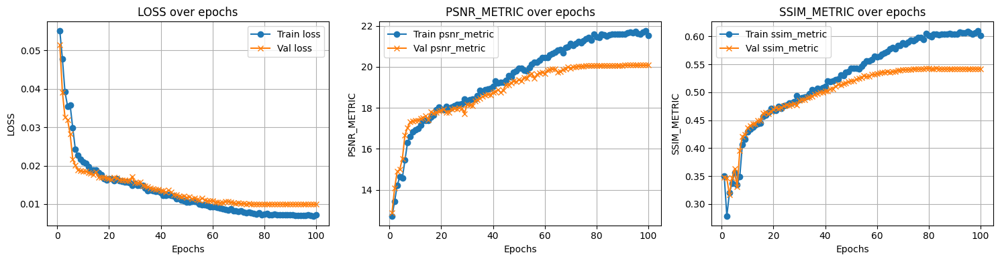

In [42]:
plot_training_history(history_basic_ae)

### CAE Profundo Opción 1

In [43]:
history_deep_ae_option_1 = train_model(deep_ae_option_1, train_ds, val_ds, epochs=100)

\Entrenando modelo `deep_autoencoder_with_reg_option_1`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 45s 4s/step - loss: 0.2315 - psnr_metric: 10.4578 - ssim_metric: 0.0333 - val_loss: 0.1741 - val_psnr_metric: 13.1318 - val_ssim_metric: 0.3261 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 933ms/step - loss: 0.1552 - psnr_metric: 14.8685 - ssim_metric: 0.2366 - val_loss: 0.1498 - val_psnr_metric: 13.6814 - val_ssim_metric: 0.3539 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - loss: 0.1286 - psnr_metric: 15.8085 - ssim_metric: 0.3570 - val_loss: 0.1309 - val_psnr_metric: 13.5215 - val_ssim_metric: 0.3486 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - loss: 0.1065 - psnr_metric: 16.1739 - ssim_metric: 0.3605 - val_loss: 0.1145 - val_psnr_metric: 13.3456 - val_ssim_metric: 0.3526 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 746ms/step - loss: 0.0880 - psnr_metric: 16.3624 - ssim_metric: 0.3912 - val_loss

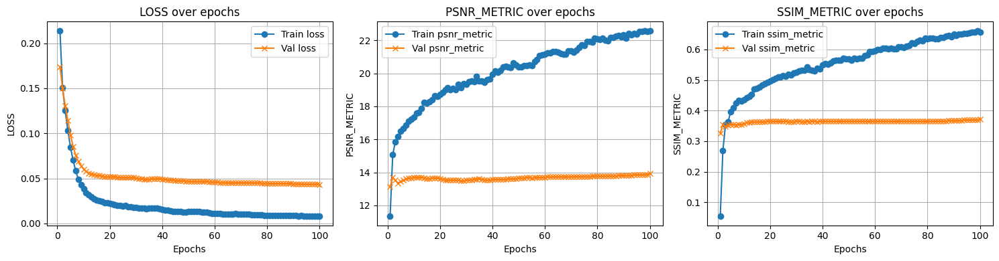

In [44]:
plot_training_history(history_deep_ae_option_1)

### CAE Profundo Opción 2

In [45]:
history_deep_ae_option_2 = train_model(deep_ae_option_2, train_ds, val_ds, epochs=100)

\Entrenando modelo `deep_autoencoder_with_reg_option_2`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 56s 5s/step - loss: 0.2054 - psnr_metric: 10.4846 - ssim_metric: 0.0497 - val_loss: 0.1538 - val_psnr_metric: 12.7028 - val_ssim_metric: 0.3221 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 351ms/step - loss: 0.1524 - psnr_metric: 12.6157 - ssim_metric: 0.2161 - val_loss: 0.1588 - val_psnr_metric: 11.1398 - val_ssim_metric: 0.2302 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 370ms/step - loss: 0.1258 - psnr_metric: 13.3065 - ssim_metric: 0.2235 - val_loss: 0.1686 - val_psnr_metric: 9.8068 - val_ssim_metric: 0.2616 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 686ms/step - loss: 0.0990 - psnr_metric: 14.2381 - ssim_metric: 0.1936 - val_loss: 0.1237 - val_psnr_metric: 11.2769 - val_ssim_metric: 0.3369 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 381ms/step - loss: 0.0773 - psnr_metric: 15.1582 - ssim_metric: 0.1993 - val_lo

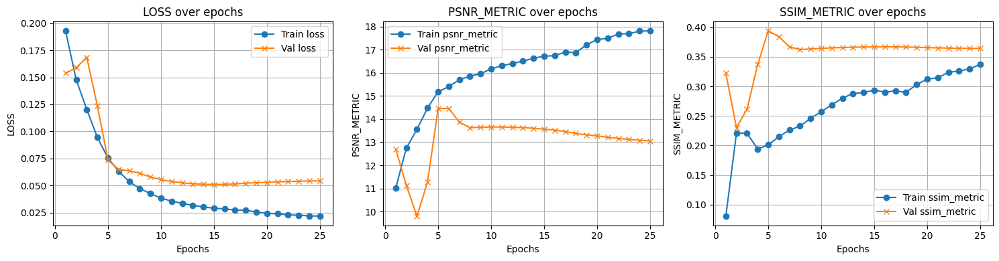

In [46]:
plot_training_history(history_deep_ae_option_2)

### CAE con skip connections Opción 1

In [47]:
history_unet_ae_option_1 = train_model(unet_ae_option_1, train_ds, val_ds, epochs=100)

\Entrenando modelo `unet_autoencoder_option_1`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 48s 5s/step - loss: 0.0570 - psnr_metric: 12.6169 - ssim_metric: 0.3103 - val_loss: 0.0489 - val_psnr_metric: 13.1234 - val_ssim_metric: 0.3012 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - loss: 0.0500 - psnr_metric: 13.1637 - ssim_metric: 0.3175 - val_loss: 0.0444 - val_psnr_metric: 13.5453 - val_ssim_metric: 0.3577 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - loss: 0.0428 - psnr_metric: 13.9340 - ssim_metric: 0.3469 - val_loss: 0.0209 - val_psnr_metric: 16.8244 - val_ssim_metric: 0.3653 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - loss: 0.0231 - psnr_metric: 16.6664 - ssim_metric: 0.3886 - val_loss: 0.0145 - val_psnr_metric: 18.4028 - val_ssim_metric: 0.4929 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - loss: 0.0151 - psnr_metric: 18.4256 - ssim_metric: 0.5012 - val_loss: 0.0128 - val

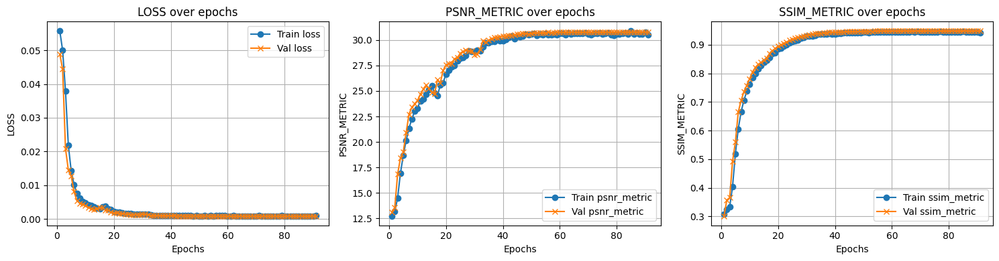

In [48]:
plot_training_history(history_unet_ae_option_1)

### CAE con skip connections Opción 2

In [49]:
history_unet_ae_option_2 = train_model(unet_ae_option_2, train_ds, val_ds, epochs=100)

\Entrenando modelo `unet_autoencoder_option_2`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 0.0558 - psnr_metric: 12.6654 - ssim_metric: 0.3407 - val_loss: 0.0509 - val_psnr_metric: 12.9479 - val_ssim_metric: 0.2553 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 25s 671ms/step - loss: 0.0519 - psnr_metric: 12.9510 - ssim_metric: 0.2250 - val_loss: 0.0389 - val_psnr_metric: 14.1138 - val_ssim_metric: 0.3416 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 671ms/step - loss: 0.0381 - psnr_metric: 14.2954 - ssim_metric: 0.2832 - val_loss: 0.0365 - val_psnr_metric: 14.3864 - val_ssim_metric: 0.3820 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - loss: 0.0316 - psnr_metric: 15.1206 - ssim_metric: 0.3505 - val_loss: 0.0361 - val_psnr_metric: 14.4396 - val_ssim_metric: 0.3931 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0297 - psnr_metric: 15.3859 - ssim_metric: 0.3680 - val_loss: 0.0352 

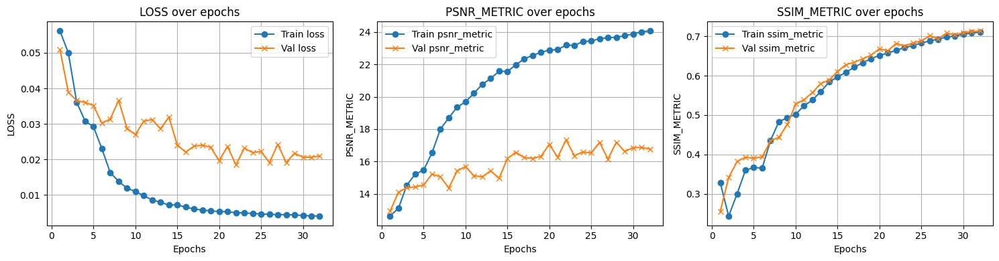

In [50]:
plot_training_history(history_unet_ae_option_2)

### CAE con encoder ResNet50 preentrenado

In [51]:
history_resnet_ae = train_model(resnet_ae, train_ds, val_ds, epochs=100)

\Entrenando modelo `resnet_autoencoder`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 53s 5s/step - loss: 0.0957 - psnr_metric: 10.4002 - ssim_metric: 0.0526 - val_loss: 0.0607 - val_psnr_metric: 12.1768 - val_ssim_metric: 0.2232 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 46s 518ms/step - loss: 0.0596 - psnr_metric: 12.3967 - ssim_metric: 0.2229 - val_loss: 0.0654 - val_psnr_metric: 11.8527 - val_ssim_metric: 0.1979 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 508ms/step - loss: 0.0541 - psnr_metric: 12.8359 - ssim_metric: 0.2577 - val_loss: 0.0657 - val_psnr_metric: 11.8323 - val_ssim_metric: 0.1985 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 11s 521ms/step - loss: 0.0483 - psnr_metric: 13.3284 - ssim_metric: 0.2164 - val_loss: 0.0620 - val_psnr_metric: 12.0887 - val_ssim_metric: 0.2109 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 11s 510ms/step - loss: 0.0373 - psnr_metric: 14.4030 - ssim_metric: 0.2268 - val_loss: 0.0630 

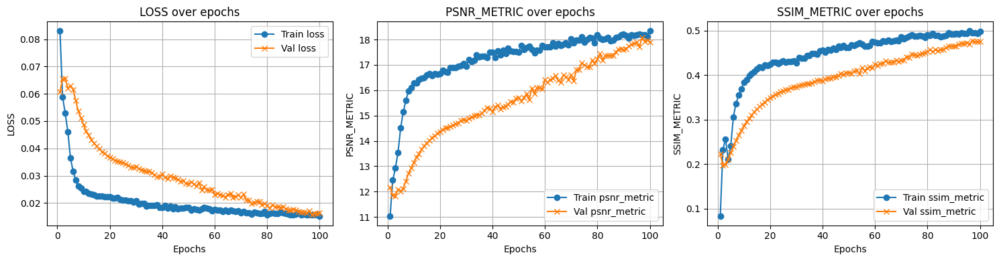

In [52]:
plot_training_history(history_resnet_ae)

#### Fine-Tunning

In [53]:
def unfreeze_last_layers(model, num_layers_to_unfreeze=20):
    # El encoder está en la segunda capa del modelo (capa index 1)
    base_model = model.layers[1]
    total_layers = len(base_model.layers)

    for layer in base_model.layers[:total_layers - num_layers_to_unfreeze]:
        layer.trainable = False
    for layer in base_model.layers[total_layers - num_layers_to_unfreeze:]:
        layer.trainable = True

In [54]:
unfreeze_last_layers(resnet_ae, num_layers_to_unfreeze=20)

In [55]:
history_resnet_finetune_ae = train_model(resnet_ae, train_ds, val_ds, epochs=40)

\Entrenando modelo `resnet_autoencoder`
Epoch 1/40
6/6 ━━━━━━━━━━━━━━━━━━━━ 53s 5s/step - loss: 0.0491 - psnr_metric: 13.3737 - ssim_metric: 0.3031 - val_loss: 0.0618 - val_psnr_metric: 12.1057 - val_ssim_metric: 0.2191 - learning_rate: 0.0010
Epoch 2/40
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - loss: 0.0283 - psnr_metric: 15.6157 - ssim_metric: 0.3848 - val_loss: 0.0549 - val_psnr_metric: 12.6167 - val_ssim_metric: 0.2271 - learning_rate: 0.0010
Epoch 3/40
6/6 ━━━━━━━━━━━━━━━━━━━━ 28s 4s/step - loss: 0.0240 - psnr_metric: 16.3197 - ssim_metric: 0.4060 - val_loss: 0.0513 - val_psnr_metric: 12.9211 - val_ssim_metric: 0.2291 - learning_rate: 0.0010
Epoch 4/40
6/6 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - loss: 0.0232 - psnr_metric: 16.4669 - ssim_metric: 0.4223 - val_loss: 0.0446 - val_psnr_metric: 13.5240 - val_ssim_metric: 0.2499 - learning_rate: 0.0010
Epoch 5/40
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - loss: 0.0219 - psnr_metric: 16.7304 - ssim_metric: 0.4399 - val_loss: 0.0400 - val_psnr_metric

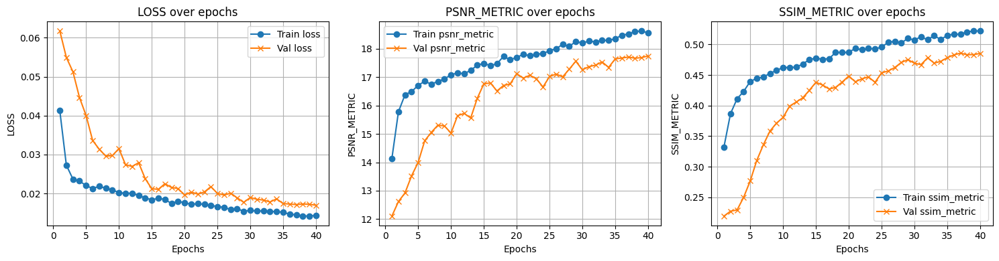

In [56]:
plot_training_history(history_resnet_finetune_ae)

### CAE con encoder VGG19 preentrenado

In [57]:
history_vgg19_ae = train_model(vgg19_ae, train_ds, val_ds, epochs=100)

\Entrenando modelo `vgg19_autoencoder`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 155s 18s/step - loss: 0.0611 - psnr_metric: 12.2881 - ssim_metric: 0.3374 - val_loss: 0.0542 - val_psnr_metric: 12.6759 - val_ssim_metric: 0.3480 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 76s 4s/step - loss: 0.0565 - psnr_metric: 12.6381 - ssim_metric: 0.3438 - val_loss: 0.0527 - val_psnr_metric: 12.7943 - val_ssim_metric: 0.3383 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - loss: 0.0621 - psnr_metric: 12.3524 - ssim_metric: 0.2783 - val_loss: 0.0521 - val_psnr_metric: 12.8418 - val_ssim_metric: 0.3449 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 18s 3s/step - loss: 0.0557 - psnr_metric: 12.7139 - ssim_metric: 0.3175 - val_loss: 0.0520 - val_psnr_metric: 12.8513 - val_ssim_metric: 0.3490 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - loss: 0.0548 - psnr_metric: 12.7606 - ssim_metric: 0.3449 - val_loss: 0.0517 - val_psnr_

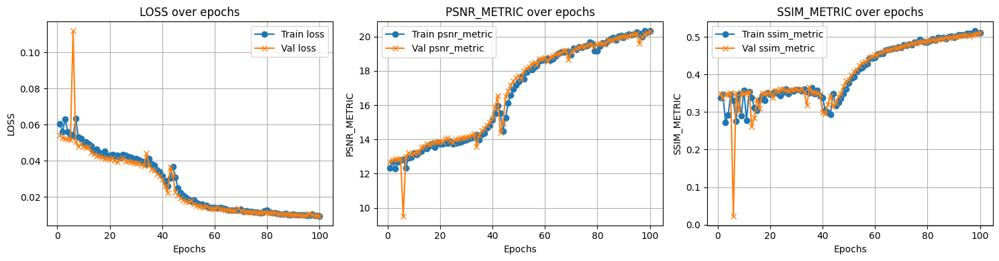

In [58]:
plot_training_history(history_vgg19_ae)

## Evaluación del modelo

In [59]:
def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union != 0 else 1.0

def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    return 2 * intersection / (y_true.sum() + y_pred.sum()) if (y_true.sum() + y_pred.sum()) != 0 else 1.0

def compute_error_maps_and_scores(model, originals):
    reconstructed = model.predict(originals)
    error_maps = np.mean((originals - reconstructed) ** 2, axis=-1)  # (N, H, W)
    scores = np.mean(error_maps, axis=(1, 2))  # (N,)
    return reconstructed, error_maps, scores

def compute_image_metrics(labels, scores, threshold=None):
    labels = np.array(labels)
    if threshold is None:
        threshold = np.percentile(scores[labels == 0], 95)
        print(f"Umbral automático (95% good): {threshold:.4f}")
    y_pred = scores > threshold

    cm = confusion_matrix(labels, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Defecto"])
    disp.plot(cmap='Blues', values_format='d')
    plt.title("Matriz de Confusión")
    plt.show()

    image_auc = roc_auc_score(labels, scores)
    print(f"\nROC-AUC (imagen): {image_auc:.4f}")

    return y_pred, threshold

def compute_pixel_metrics(masks, labels, error_maps, threshold):
    labels = np.array(labels)
    mask_flat = masks[labels == 1].reshape(-1)
    errors_flat = error_maps[labels == 1].reshape(-1)
    pixel_auc = roc_auc_score(mask_flat > 0.5, errors_flat)
    print(f"ROC-AUC (pixel): {pixel_auc:.4f}")

    predicted_masks = error_maps > threshold

    y_true_pixels = masks.reshape(-1) > 0.5
    y_pred_pixels = predicted_masks.reshape(-1)

    precision = precision_score(y_true_pixels, y_pred_pixels)
    recall = recall_score(y_true_pixels, y_pred_pixels)
    f1 = f1_score(y_true_pixels, y_pred_pixels)
    iou = iou_score(y_true_pixels, y_pred_pixels)
    dice = dice_score(y_true_pixels, y_pred_pixels)

    print(f"\nMétricas a nivel pixel:")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-score: {f1:.4f}")
    print(f"IoU: {iou:.4f}")
    print(f"Dice: {dice:.4f}")

    return predicted_masks

def plot_examples(originals, reconstructed, error_maps, masks, predicted_masks, labels, y_pred):
    random_indices = np.random.choice(len(originals), size=3, replace=False)
    for i in random_indices:
        plt.figure(figsize=(15, 4))

        plt.subplot(1, 5, 1)
        plt.imshow(originals[i])
        plt.title("Original")
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.imshow(reconstructed[i])
        plt.title("Reconstrucción")
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(error_maps[i], cmap='hot')
        plt.title("Mapa error")
        plt.axis('off')

        plt.subplot(1, 5, 4)
        plt.imshow(predicted_masks[i], cmap='gray')
        plt.title("Máscara Predicha")
        plt.axis('off')

        plt.subplot(1, 5, 5)
        plt.imshow(masks[i], cmap='gray')
        plt.title("Máscara GT")
        plt.axis('off')

        plt.suptitle(f"Label: {'Defecto' if labels[i] == 1 else 'Normal'} - Pred: {'Defecto' if y_pred[i] else 'Normal'}")
        plt.tight_layout()
        plt.show()


### CAE Básico

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Umbral automático (95% good): 0.0127

ROC-AUC (imagen): 0.7927


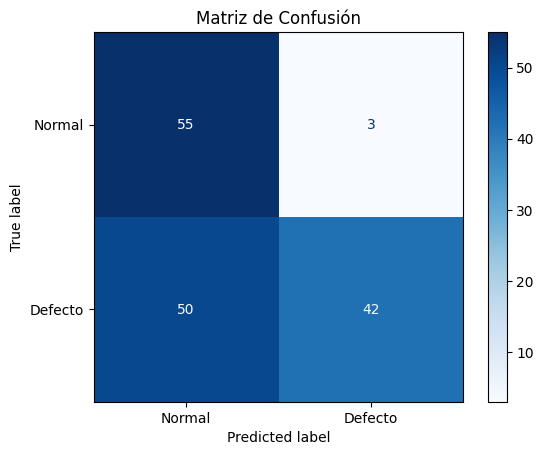


Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.52      0.95      0.67        58
     Defecto       0.93      0.46      0.61        92

    accuracy                           0.65       150
   macro avg       0.73      0.70      0.64       150
weighted avg       0.77      0.65      0.64       150



In [61]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(basic_ae, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [62]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.8267

Métricas a nivel pixel:
Precision: 0.1017
Recall: 0.6990
F1-score: 0.1776
IoU: 0.0975
Dice: 0.1776

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.99      0.82      0.90   9550483
     Defecto       0.10      0.70      0.18    279917

    accuracy                           0.82   9830400
   macro avg       0.55      0.76      0.54   9830400
weighted avg       0.96      0.82      0.88   9830400



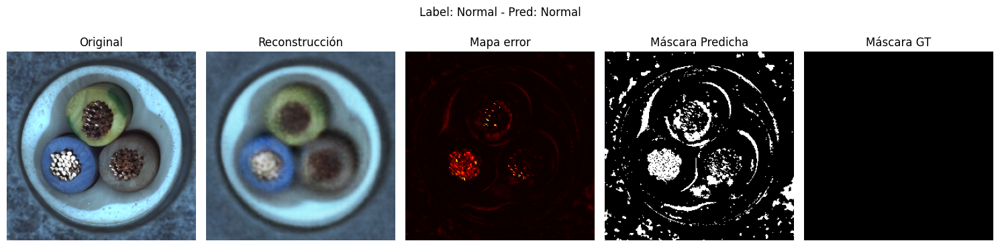

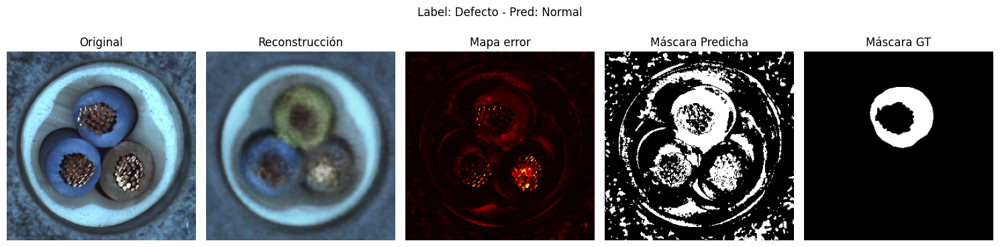

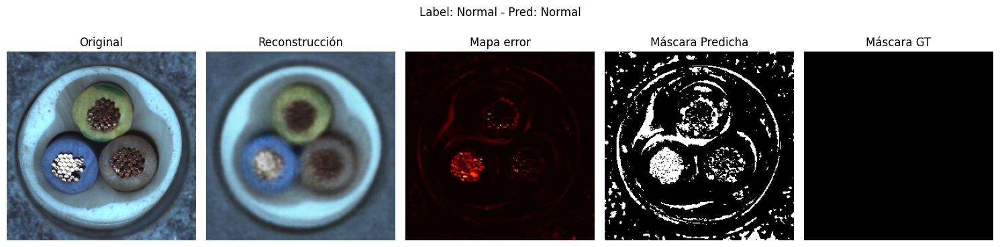

In [63]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### CAE Profundo Opción 1

5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 829ms/step
Umbral automático (95% good): 0.0477

ROC-AUC (imagen): 0.5703


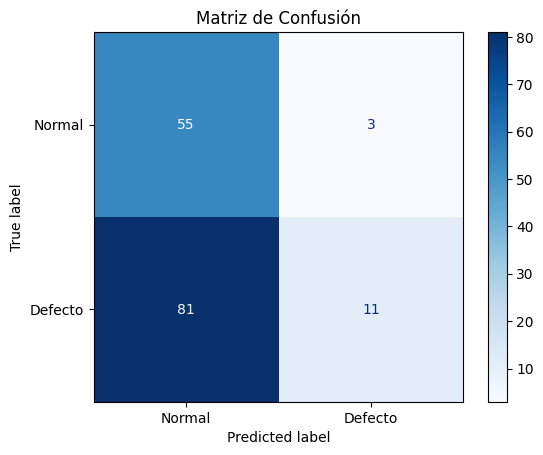


Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.40      0.95      0.57        58
     Defecto       0.79      0.12      0.21        92

    accuracy                           0.44       150
   macro avg       0.60      0.53      0.39       150
weighted avg       0.64      0.44      0.35       150



In [64]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(deep_ae_option_1, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [65]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.7275

Métricas a nivel pixel:
Precision: 0.0718
Recall: 0.6112
F1-score: 0.1285
IoU: 0.0687
Dice: 0.1285

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.99      0.77      0.86   9550483
     Defecto       0.07      0.61      0.13    279917

    accuracy                           0.76   9830400
   macro avg       0.53      0.69      0.50   9830400
weighted avg       0.96      0.76      0.84   9830400



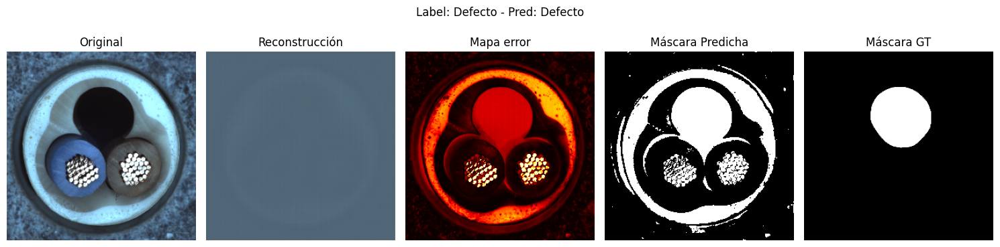

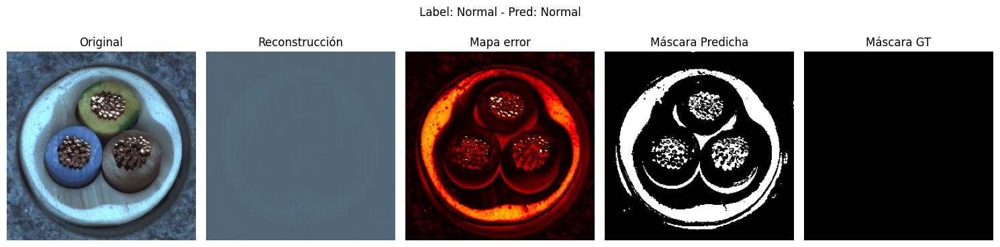

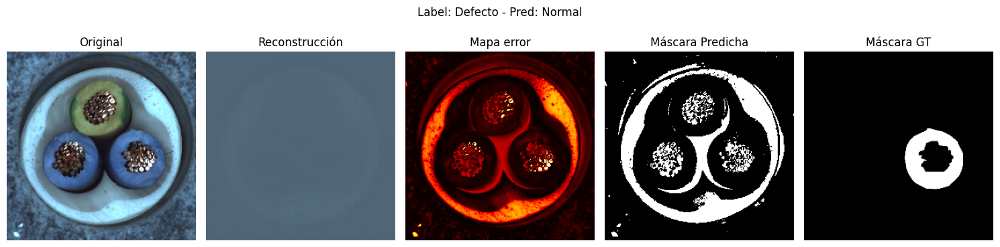

In [66]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### CAE Profundo Opción 2

4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 790ms/step
Umbral automático (95% good): 0.0534

ROC-AUC (imagen): 0.5609


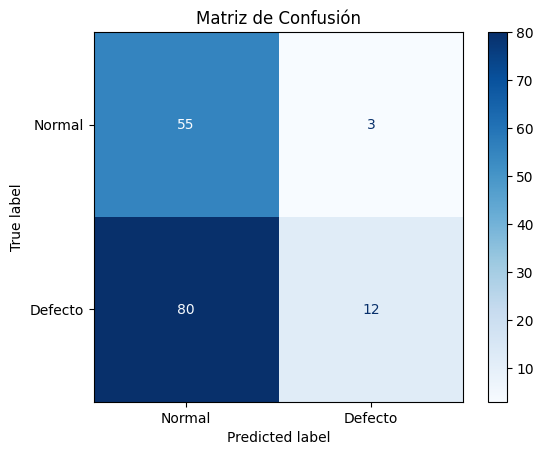


Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.41      0.95      0.57        58
     Defecto       0.80      0.13      0.22        92

    accuracy                           0.45       150
   macro avg       0.60      0.54      0.40       150
weighted avg       0.65      0.45      0.36       150



In [67]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(deep_ae_option_2, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [68]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.7007

Métricas a nivel pixel:
Precision: 0.0698
Recall: 0.5370
F1-score: 0.1236
IoU: 0.0659
Dice: 0.1236

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.98      0.79      0.88   9550483
     Defecto       0.07      0.54      0.12    279917

    accuracy                           0.78   9830400
   macro avg       0.53      0.66      0.50   9830400
weighted avg       0.96      0.78      0.85   9830400



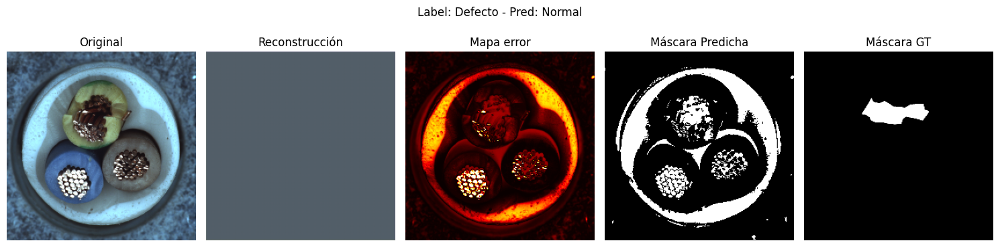

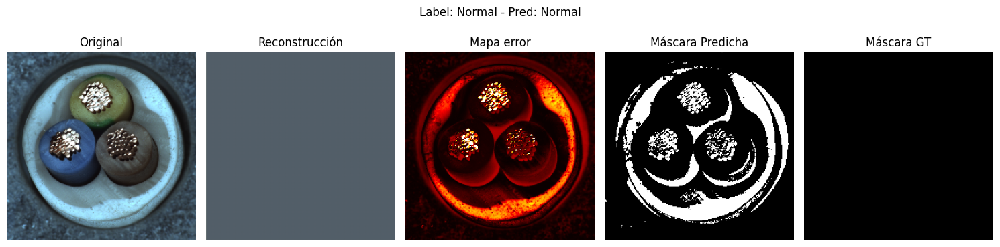

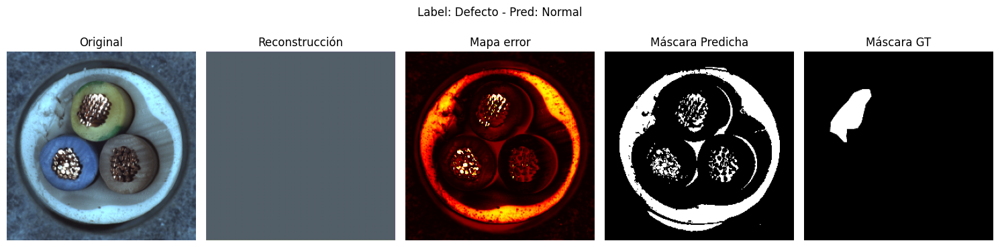

In [69]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### CAE con skip connections Opción 1

5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step
Umbral automático (95% good): 0.0011

ROC-AUC (imagen): 0.4603


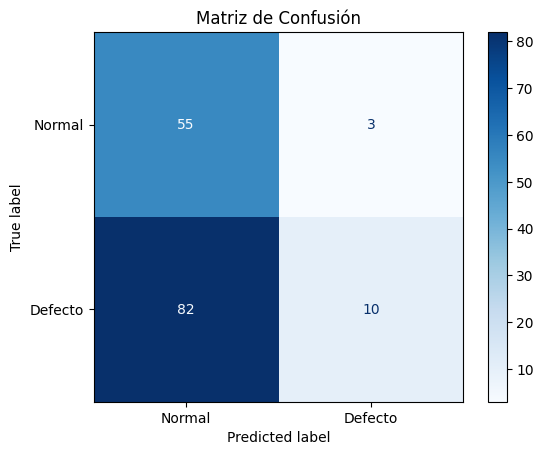


Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.40      0.95      0.56        58
     Defecto       0.77      0.11      0.19        92

    accuracy                           0.43       150
   macro avg       0.59      0.53      0.38       150
weighted avg       0.63      0.43      0.33       150



In [70]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(unet_ae_option_1, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [71]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.6045

Métricas a nivel pixel:
Precision: 0.0379
Recall: 0.1980
F1-score: 0.0636
IoU: 0.0328
Dice: 0.0636

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.97      0.85      0.91   9550483
     Defecto       0.04      0.20      0.06    279917

    accuracy                           0.83   9830400
   macro avg       0.51      0.53      0.49   9830400
weighted avg       0.95      0.83      0.88   9830400



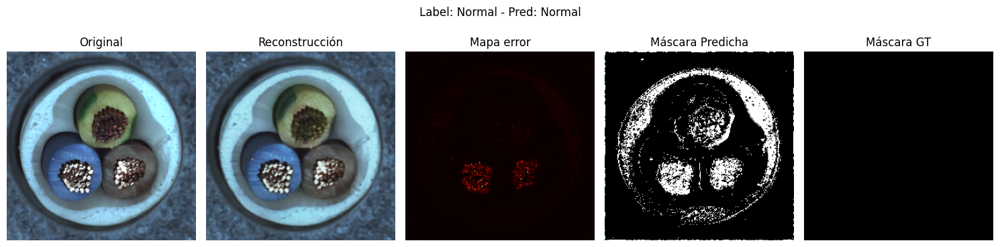

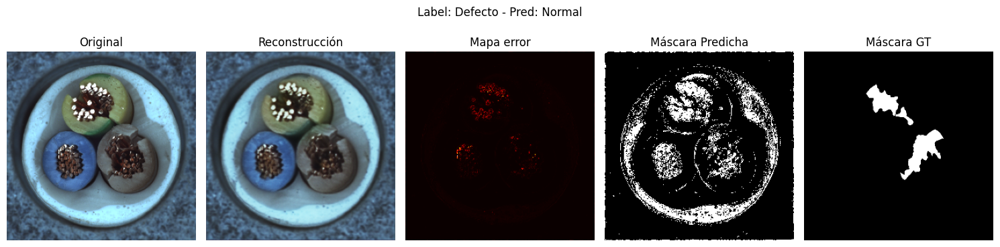

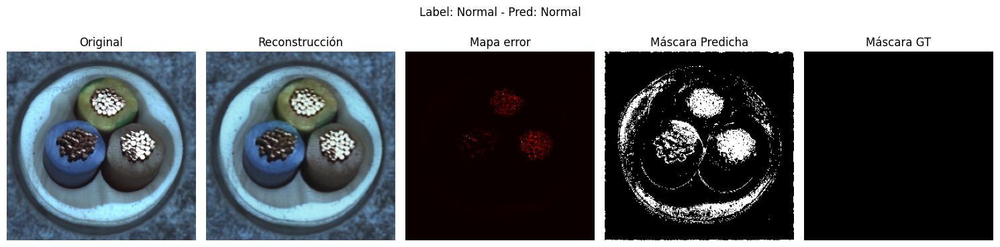

In [72]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### CAE con skip connections Opción 2

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step
Umbral automático (95% good): 0.0200

ROC-AUC (imagen): 0.4687


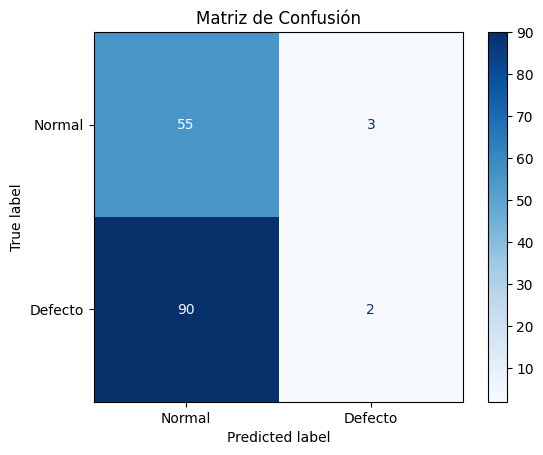


Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.38      0.95      0.54        58
     Defecto       0.40      0.02      0.04        92

    accuracy                           0.38       150
   macro avg       0.39      0.49      0.29       150
weighted avg       0.39      0.38      0.23       150



In [73]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(unet_ae_option_2, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [74]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.5756

Métricas a nivel pixel:
Precision: 0.0279
Recall: 0.3033
F1-score: 0.0510
IoU: 0.0262
Dice: 0.0510

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.97      0.69      0.81   9550483
     Defecto       0.03      0.30      0.05    279917

    accuracy                           0.68   9830400
   macro avg       0.50      0.50      0.43   9830400
weighted avg       0.94      0.68      0.79   9830400



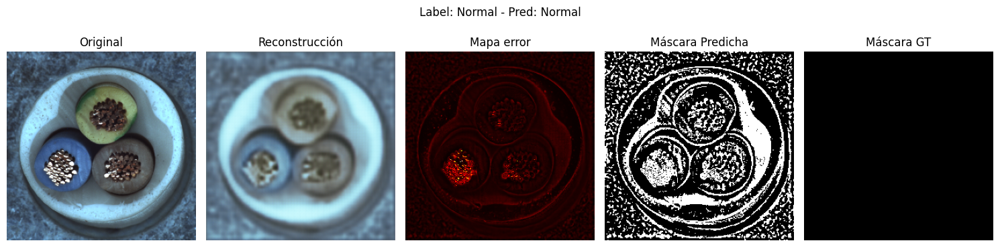

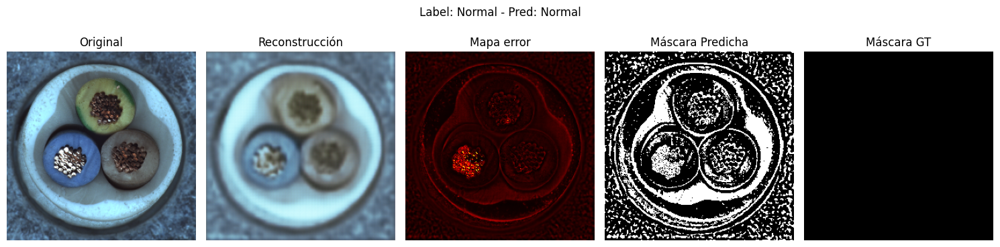

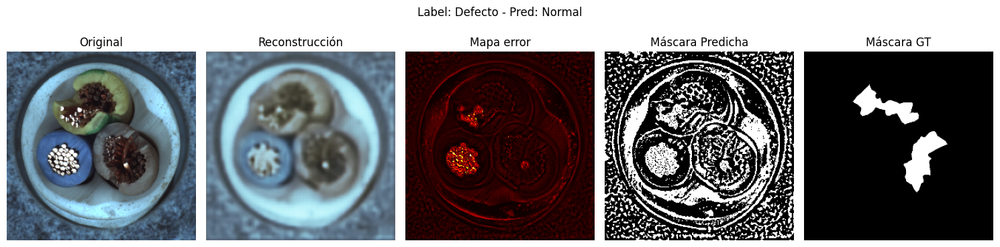

In [75]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### CAE con encoder ResNet50 preentrenado

5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
Umbral automático (95% good): 0.0210

ROC-AUC (imagen): 0.7118


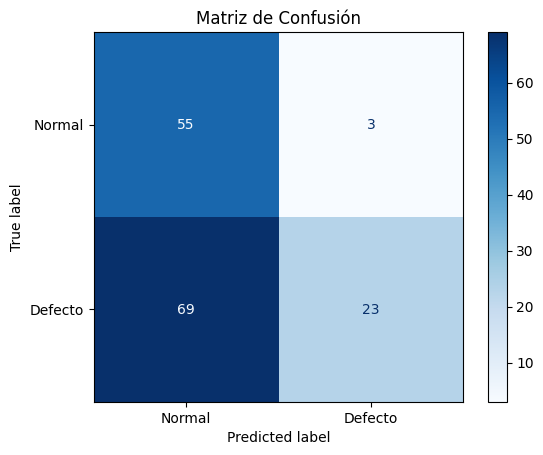


Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.44      0.95      0.60        58
     Defecto       0.88      0.25      0.39        92

    accuracy                           0.52       150
   macro avg       0.66      0.60      0.50       150
weighted avg       0.71      0.52      0.47       150



In [76]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(resnet_ae, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [77]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.7637

Métricas a nivel pixel:
Precision: 0.0747
Recall: 0.5900
F1-score: 0.1326
IoU: 0.0710
Dice: 0.1326

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.98      0.79      0.87   9550483
     Defecto       0.07      0.59      0.13    279917

    accuracy                           0.78   9830400
   macro avg       0.53      0.69      0.50   9830400
weighted avg       0.96      0.78      0.85   9830400



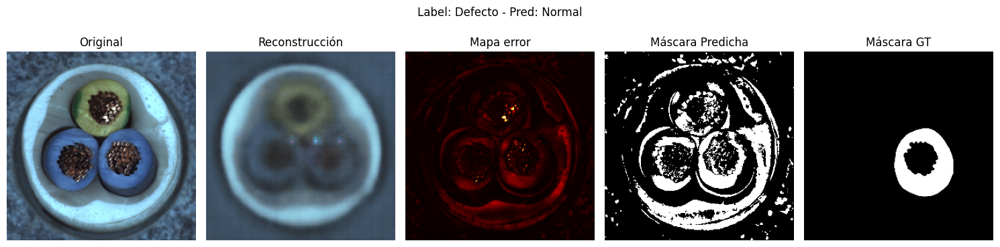

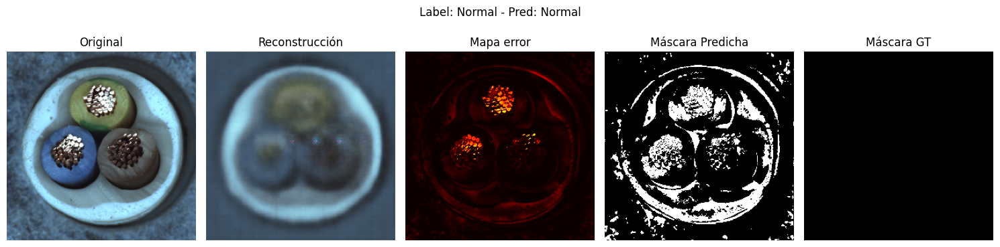

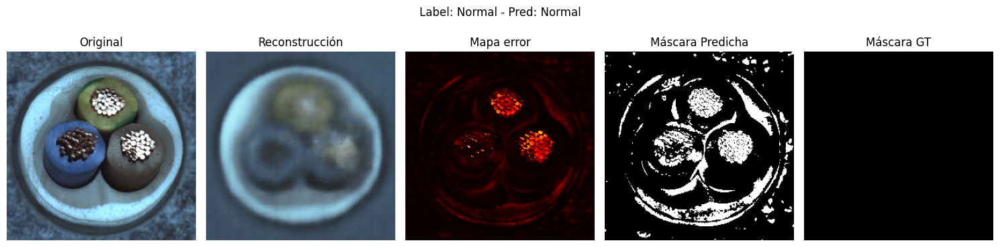

In [78]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### CAE con encoder VGG19 preentrenado

5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step
Umbral automático (95% good): 0.0112

ROC-AUC (imagen): 0.5680


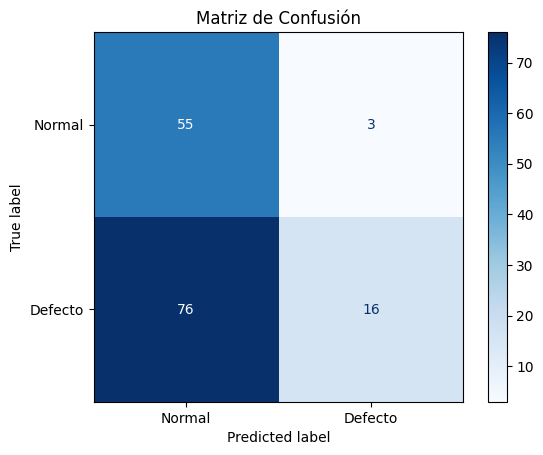


Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.42      0.95      0.58        58
     Defecto       0.84      0.17      0.29        92

    accuracy                           0.47       150
   macro avg       0.63      0.56      0.44       150
weighted avg       0.68      0.47      0.40       150



In [79]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(vgg19_ae, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [80]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.6055

Métricas a nivel pixel:
Precision: 0.0493
Recall: 0.3189
F1-score: 0.0854
IoU: 0.0446
Dice: 0.0854

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.98      0.82      0.89   9550483
     Defecto       0.05      0.32      0.09    279917

    accuracy                           0.81   9830400
   macro avg       0.51      0.57      0.49   9830400
weighted avg       0.95      0.81      0.87   9830400



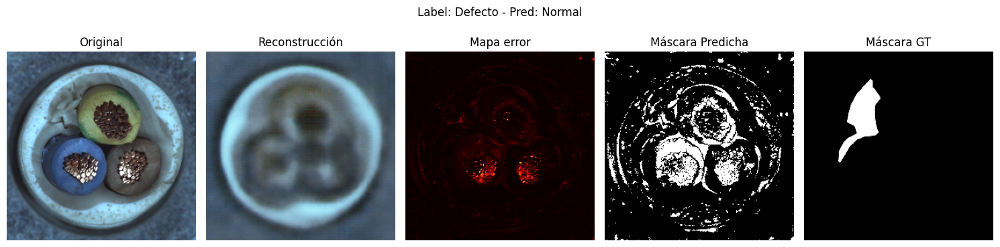

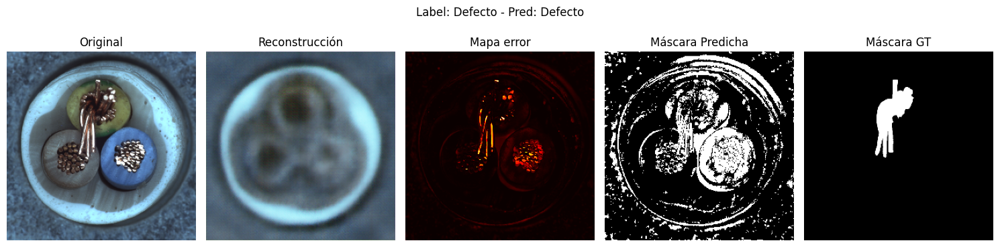

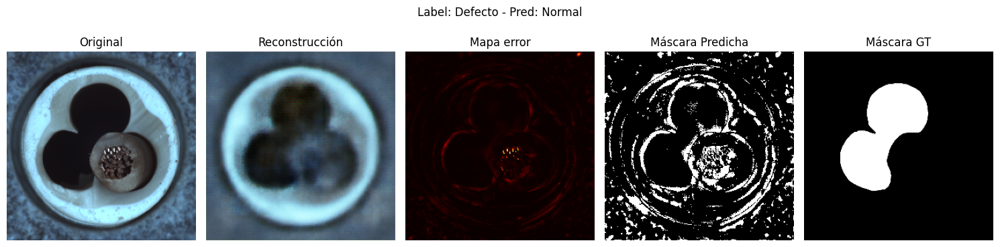

In [81]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)